In [1]:
#matk
!pip install -q git+https://github.com/VSydorskyy/iasa_multiagent.git@flck-dev
!pip install -q cmasher

In [2]:
import os

import math
import json
import numpy as np
import pandas as pd

from itertools import product
from tqdm.auto import tqdm
from joblib import Parallel, delayed

from IPython.display import HTML
from matplotlib import pyplot as plt

from plotly.subplots import make_subplots
import plotly.graph_objects as go

from matk.utils.animation import animate_frames
from matk.models.flocking import FlockingModel

class ProgressParallel(Parallel):
    def __init__(self, use_tqdm=True, total=None, *args, **kwargs):
        self._use_tqdm = use_tqdm
        self._total = total
        super().__init__(*args, **kwargs)

    def __call__(self, *args, **kwargs):
        with tqdm(disable=not self._use_tqdm, total=self._total) as self._pbar:
            return Parallel.__call__(self, *args, **kwargs)

    def print_progress(self):
        if self._total is None:
            self._pbar.total = self.n_dispatched_tasks
        self._pbar.n = self.n_completed_tasks
        self._pbar.refresh()

In [3]:
N_STEPS = 500
import matplotlib
matplotlib.rcParams['animation.embed_limit'] = 2**128

## one run

In [6]:
%timeit
model_config = dict(
    field_size=(128,128), 
    n_points = 320,
    step_size=5,
    cohere_speed=0.225*3,
    align_speed=0.375*3,
    separate_speed=0.1125*3,
    vision=35,
    minimum_separation=2,
    min_flock_samples=1,
    use_flock_analyze=False
)
emodel = FlockingModel(**model_config)
emodel.run_n_steps(300, verbose=True)

100%|██████████| 300/300 [00:09<00:00, 30.99it/s]


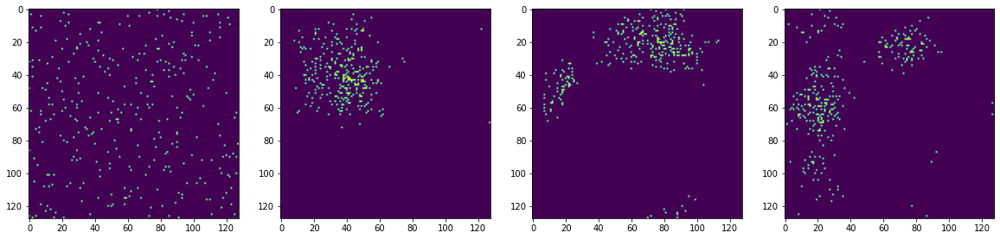

In [25]:
fig, axs = plt.subplots(1, 4, figsize=(20, 10))
for ax, interp in zip(axs, [emodel[0], emodel[20], emodel[100],emodel[-10]]):
    ax.imshow(interp)

plt.show()

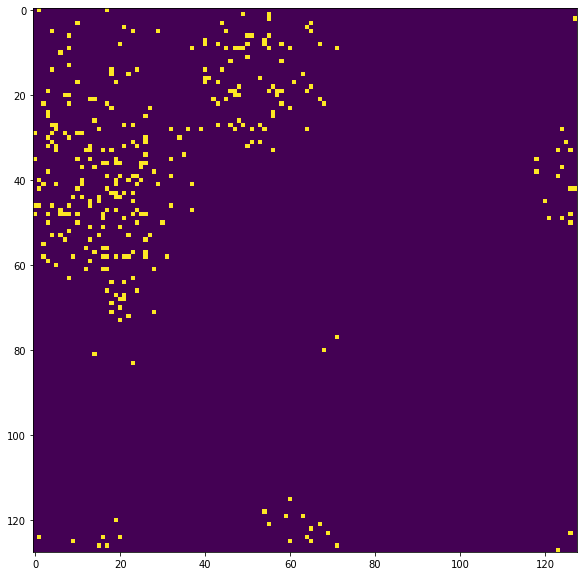

In [8]:
ani = animate_frames(emodel[-300:], figsize=(10,10), interval=500)
HTML(ani.to_jshtml())

In [9]:
emodel.flock_history[-1]

AttributeError: 'FlockingModel' object has no attribute 'flock_history'

## Flock counts

In [4]:
def run_flock_experiments(model_config, n_jobs=2):
    # 20*10*11
    visions = np.linspace(2, 20, 19)
    min_separations = np.linspace(1, 8, 8)
    
    monte_carlo_steps = 20

    def single_experiment(min_separation, vision, model_config):
        model_config["vision"] = vision
        model_config["minimum_separation"] = min_separation
        
        emodel = FlockingModel(**model_config)
        emodel.run_n_steps(N_STEPS, verbose=False)
        
        flocks_counts = pd.DataFrame(emodel.flock_history)["n_flocks"].values
        
        return {"vision": vision, "minimum_separation": min_separation, "n_flocks": flocks_counts}

    experiment_grid = product(min_separations, visions, range(monte_carlo_steps))
    result = ProgressParallel(n_jobs=n_jobs, total=20 * 19 * 8)(
        delayed(single_experiment)(msep, vis, model_config) for msep, vis, _ in experiment_grid
    )

    result = pd.DataFrame(result)
    result.to_csv("./flock_logs/flocky.csv", index=False)


**Run & Save**

In [8]:
model_config = dict(
    field_size=(96,96), 
    n_points = 80,
    step_size=4,
    cohere_speed=0.225,
    align_speed=0.375,
    separate_speed=0.1125,
    min_flock_samples=1,
    use_flock_analyze=True
)
run_flock_experiments(model_config,n_jobs=os.cpu_count())

In [8]:
flck_df = pd.read_csv("./flock_logs/flocky.csv")

**Visualize results**

In [9]:
flck_df["n_flocks"] = flck_df["n_flocks"].apply(lambda x: 
                           np.fromstring(
                               x.replace('\n','')
                                .replace('[','')
                                .replace(']','')
                                .replace('  ',' '), sep=' '))

In [10]:
flck_df = flck_df.groupby(["vision", "minimum_separation"])["n_flocks"].apply(np.mean).reset_index()

In [11]:
"""colors = [
    "#d5e68d",
    "#dfc0c0",
    "#2d3142",
    "#264653",
    "#2a9d8f",
    "#e9c46a",
    "#f4a261",
    "#e76f51",
    "#590925",
]"""

import cmasher as cmr

colors = cmr.take_cmap_colors('viridis', 8, return_fmt='hex')


for vision in flck_df["vision"].unique():
    fig1 = go.Figure()
    temp_df = flck_df[flck_df.vision == vision]
    
    for j, min_sep in enumerate(temp_df["minimum_separation"].unique()):
        temp2_df = temp_df[temp_df.minimum_separation==min_sep]
        fig1.add_trace(
            go.Scatter(
                x=np.arange(len(temp2_df["n_flocks"].values[0])),
                y=temp2_df["n_flocks"].values[0],
                line=dict(color=colors[j], width=2.2),
                opacity=0.75,
                name=f"separation: {round(min_sep,2)}",
            )
        )

    fig1.update_layout(
        title={"text": f"Vision: {vision}", "x": 0.5, "xanchor": "center"},
        xaxis_title="time",
        yaxis_title="Amount of flocks",
        plot_bgcolor="#f2f2f2",
    )
    del temp_df, temp2_df
    fig1.show()